In [1]:
import itertools
from sklearn.linear_model import Lasso
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import StandardScaler
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler
from sklearn.ensemble import AdaBoostClassifier, BaggingClassifier, RandomForestClassifier
from sklearn.linear_model import LogisticRegression, RidgeClassifier, SGDClassifier
from sklearn.metrics import accuracy_score, ConfusionMatrixDisplay, auc, confusion_matrix, f1_score, make_scorer, precision_score, recall_score, roc_auc_score, roc_curve
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, RepeatedStratifiedKFold, StratifiedKFold, cross_val_score, cross_validate, train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from imblearn.pipeline import make_pipeline as make_pipeline
from imblearn.pipeline import Pipeline
from xgboost import XGBClassifier

In [2]:
df = pd.read_csv("data.csv")

In [3]:
df.shape

(6819, 96)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 96 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   Bankrupt?                                                 6819 non-null   int64  
 1    ROA(C) before interest and depreciation before interest  6819 non-null   float64
 2    ROA(A) before interest and % after tax                   6819 non-null   float64
 3    ROA(B) before interest and depreciation after tax        6819 non-null   float64
 4    Operating Gross Margin                                   6819 non-null   float64
 5    Realized Sales Gross Margin                              6819 non-null   float64
 6    Operating Profit Rate                                    6819 non-null   float64
 7    Pre-tax net Interest Rate                                6819 non-null   float64
 8    After-tax net Int

In [5]:
df.head(10)

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,...,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,...,0.795297,0.008323,0.623652,0.610237,0.839969,0.283846,0.264577,0.570175,1,0.020794
2,1,0.426071,0.499019,0.472295,0.601450,0.601364,0.998857,0.796403,0.808388,0.302035,...,0.774670,0.040003,0.623841,0.601449,0.836774,0.290189,0.026555,0.563706,1,0.016474
3,1,0.399844,0.451265,0.457733,0.583541,0.583541,0.998700,0.796967,0.808966,0.303350,...,0.739555,0.003252,0.622929,0.583538,0.834697,0.281721,0.026697,0.564663,1,0.023982
4,1,0.465022,0.538432,0.522298,0.598783,0.598783,0.998973,0.797366,0.809304,0.303475,...,0.795016,0.003878,0.623521,0.598782,0.839973,0.278514,0.024752,0.575617,1,0.035490
5,1,0.388680,0.415177,0.419134,0.590171,0.590251,0.998758,0.796903,0.808771,0.303116,...,0.710420,0.005278,0.622605,0.590172,0.829939,0.285087,0.026675,0.564538,1,0.019534
6,0,0.390923,0.445704,0.436158,0.619950,0.619950,0.998993,0.797012,0.808960,0.302814,...,0.736619,0.018372,0.623655,0.619949,0.829980,0.292504,0.026622,0.564200,1,0.015663
7,0,0.508361,0.570922,0.559077,0.601738,0.601717,0.999009,0.797449,0.809362,0.303545,...,0.815350,0.010005,0.623843,0.601739,0.841459,0.278607,0.027031,0.566089,1,0.034889
8,0,0.488519,0.545137,0.543284,0.603612,0.603612,0.998961,0.797414,0.809338,0.303584,...,0.803647,0.000824,0.623977,0.603613,0.840487,0.276423,0.026891,0.565592,1,0.065826
9,0,0.495686,0.550916,0.542963,0.599209,0.599209,0.999001,0.797404,0.809320,0.303483,...,0.804195,0.005798,0.623865,0.599205,0.840688,0.279388,0.027243,0.566668,1,0.030801


In [6]:
df.describe()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
count,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,...,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.0,6819.000000
mean,0.032263,0.505180,0.558625,0.553589,0.607948,0.607929,0.998755,0.797190,0.809084,0.303623,...,0.807760,1.862942e+07,0.623915,0.607946,0.840402,0.280365,0.027541,0.565358,1.0,0.047578
std,0.176710,0.060686,0.065620,0.061595,0.016934,0.016916,0.013010,0.012869,0.013601,0.011163,...,0.040332,3.764501e+08,0.012290,0.016934,0.014523,0.014463,0.015668,0.013214,0.0,0.050014
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.000000
25%,0.000000,0.476527,0.535543,0.527277,0.600445,0.600434,0.998969,0.797386,0.809312,0.303466,...,0.796750,9.036205e-04,0.623636,0.600443,0.840115,0.276944,0.026791,0.565158,1.0,0.024477
50%,0.000000,0.502706,0.559802,0.552278,0.605997,0.605976,0.999022,0.797464,0.809375,0.303525,...,0.810619,2.085213e-03,0.623879,0.605998,0.841179,0.278778,0.026808,0.565252,1.0,0.033798
75%,0.000000,0.535563,0.589157,0.584105,0.613914,0.613842,0.999095,0.797579,0.809469,0.303585,...,0.826455,5.269777e-03,0.624168,0.613913,0.842357,0.281449,0.026913,0.565725,1.0,0.052838
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,9.820000e+09,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.000000


In [7]:
df['Bankrupt?'].value_counts()

Bankrupt?
0    6599
1     220
Name: count, dtype: int64

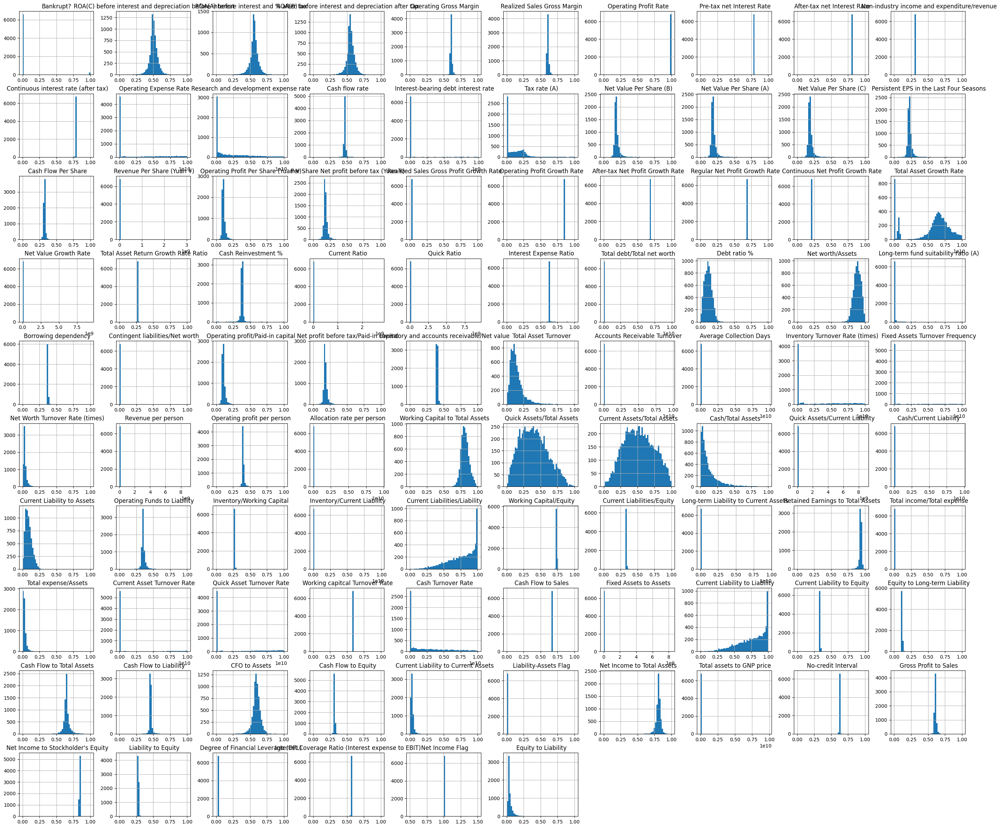

In [8]:
df.hist(figsize = (35,30), bins = 50)
plt.show()

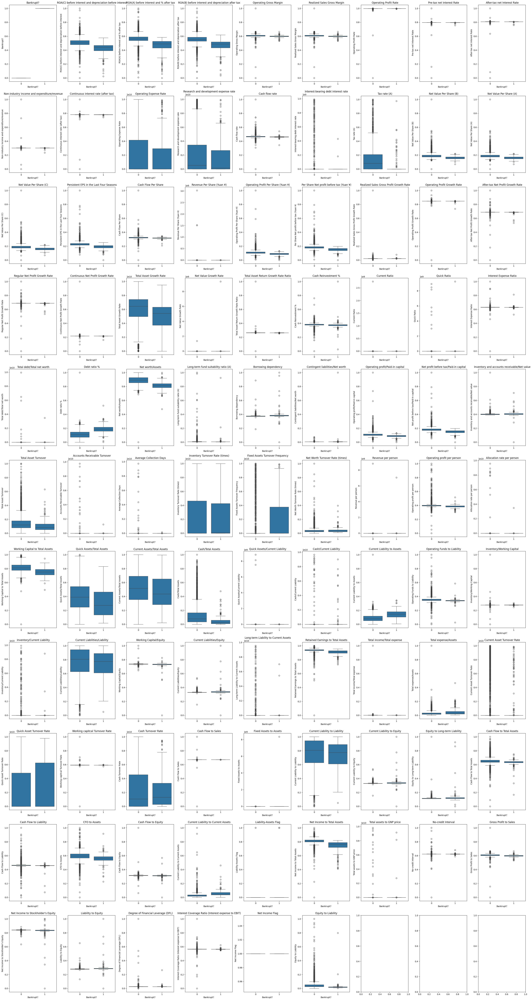

In [9]:
num_features = len(df.select_dtypes(include='number').columns)
num_cols = 9
num_rows = (num_features + num_cols - 1) // num_cols 

f, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(35, num_rows * 6))

for i, col in enumerate(df.select_dtypes(include='number').columns):
    sb.boxplot(x='Bankrupt?', y=col, data=df, ax=axes[i // num_cols, i % num_cols])
    axes[i // num_cols, i % num_cols].set_title(col)

plt.tight_layout()
plt.show()

<ipython-input-10-778da13ee3a5>:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sb.distplot(df[(df['Bankrupt?'] == 0) & (df[col] < 1)][col].apply(lambda x: x * 100),
c:\Python311\Lib\site-packages\seaborn\distributions.py:2496: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  kdeplot(**{axis: a}, ax=ax, color=kde_color, **kde_kws)
<ipython-input-10-778da13ee3a5>:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level fu

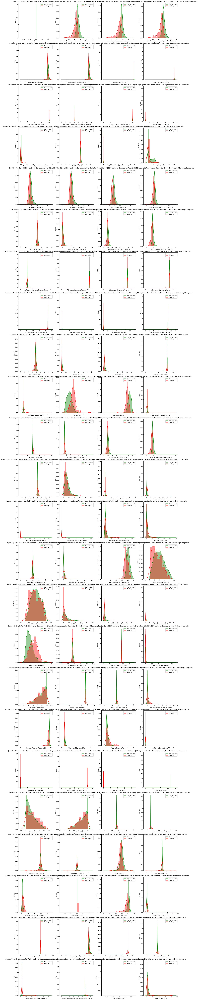

In [10]:
num_columns = len(df.columns)
num_plots = (num_columns + 3) // 4

fig, axs = plt.subplots(num_plots, 4, figsize=(20, 5 * num_plots), constrained_layout=True)

for i, col in enumerate(df.columns):
    row, col_num = divmod(i, 4)
    
    ax = axs[row, col_num]
    
    sb.distplot(df[(df['Bankrupt?'] == 0) & (df[col] < 1)][col].apply(lambda x: x * 100),
                color='green', label='Not Bankrupt', ax=ax)
    
    sb.distplot(df[(df['Bankrupt?'] == 1) & (df[col] < 1)][col].apply(lambda x: x * 100),
                color='red', label='Bankrupt', ax=ax)
    
    ax.set_title(f'{col} Distribution for Bankrupt and Not Bankrupt Companies', fontsize=12)
    ax.set_xlabel(f'{col} %', fontsize=10)
    ax.set_ylabel('Density', fontsize=10)
    ax.legend(loc='upper right')

plt.show()

In [11]:
[print(col) for col in df if df[col].isna().sum() > 0]

[]

In [12]:
df.duplicated().sum()

0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


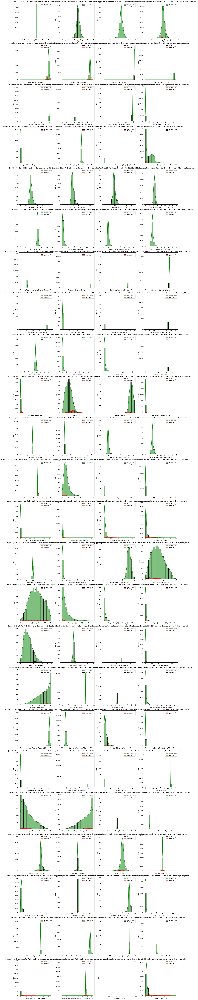

In [13]:
num_columns = len(df.columns)
num_plots = (num_columns + 3) // 4  # Calculate the number of required plots, rounding up

fig, axs = plt.subplots(num_plots, 4, figsize=(20, 5 * num_plots), constrained_layout=True)

for i, col in enumerate(df.columns):
    row, col_num = divmod(i, 4)
    
    ax = axs[row, col_num]
    
    sb.histplot(df[(df['Bankrupt?'] == 0) & (df[col] < 1)][col].apply(lambda x: x * 100),
                 color='green', label='Not Bankrupt', ax=ax, kde=True, bins=20)
    
    sb.histplot(df[(df['Bankrupt?'] == 1) & (df[col] < 1)][col].apply(lambda x: x * 100),
                 color='red', label='Bankrupt', ax=ax, kde=True, bins=20)
    
    ax.set_title(f'{col} Distribution for Bankrupt and Not Bankrupt Companies', fontsize=12)
    ax.set_xlabel(f'{col} %', fontsize=10)
    ax.set_ylabel('Count', fontsize=10)
    ax.legend(loc='upper right')

plt.show()

In [14]:
def outlier_thresholds(dataframe, variable, low_quantile=0.15, up_quantile=0.85):
    quantile_one = dataframe[variable].quantile(low_quantile)
    quantile_three = dataframe[variable].quantile(up_quantile)
    interquantile_range = quantile_three - quantile_one
    up_limit = quantile_three + 1.5 * interquantile_range
    low_limit = quantile_one - 1.5 * interquantile_range
    return low_limit, up_limit

def check_outlier(dataframe, col_name):
    low_limit, up_limit = outlier_thresholds(dataframe, col_name)
    if dataframe[(dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)].any(axis=None):
        return True
    else:
        return False
# for col in num_cols:
#       col, check_outlier(df, col)

def replace_with_thresholds(dataframe, variable):
    low_limit, up_limit = outlier_thresholds(dataframe, variable)
    dataframe.loc[(dataframe[variable] < low_limit), variable] = low_limit
    dataframe.loc[(dataframe[variable] > up_limit), variable] = up_limit



def outliers_removal(feature,feature_name,dataset):
    
    q25, q75 = np.percentile(feature, 25), np.percentile(feature, 75)
    feat_iqr = q75 - q25
    
    feat_cut_off = feat_iqr * 1.5
    feat_lower, feat_upper = q25 - feat_cut_off, q75 + feat_cut_off

    dataset = dataset.drop(dataset[(dataset[feature_name] > feat_upper) | (dataset[feature_name] < feat_lower)].index)
    
    return dataset

for col in df:
    new_df = outliers_removal(df[col],str(col),df)
# for col in num_cols:
#         replace_with_thresholds(df,col)

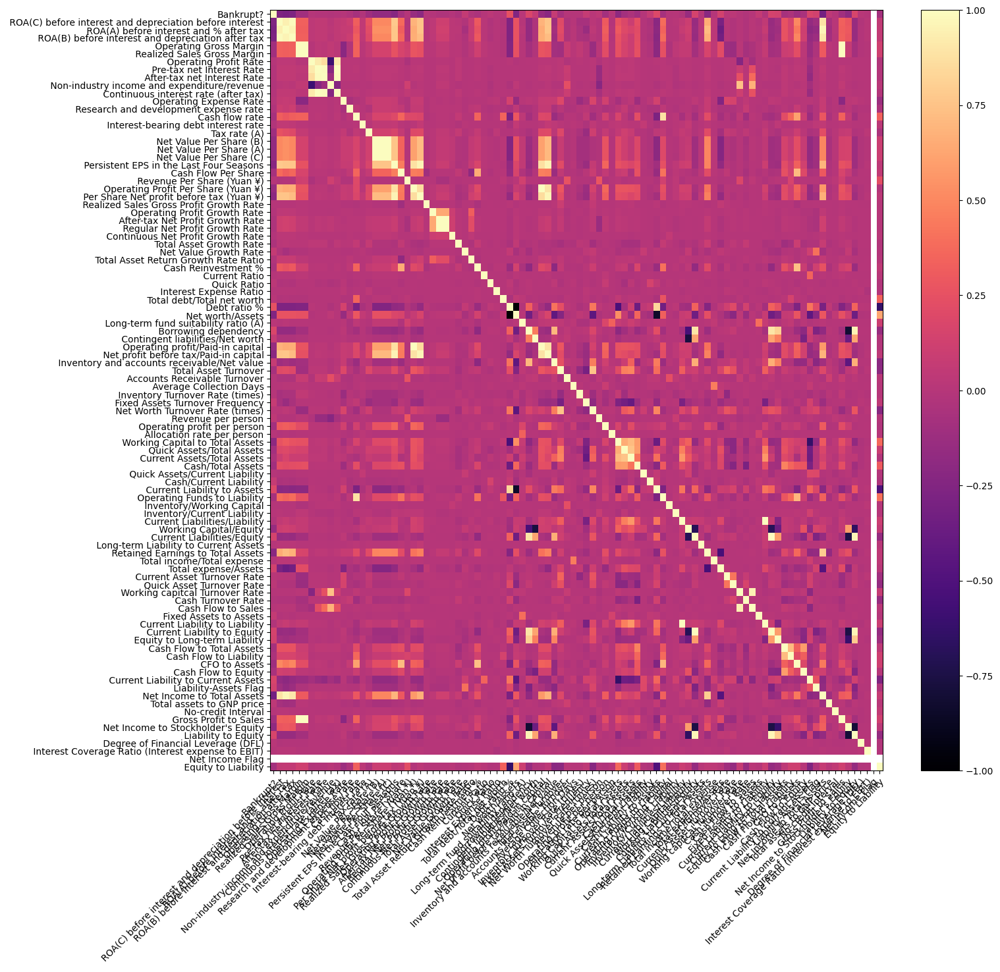

In [15]:
corr_matrix = df.corr()
fig, ax = plt.subplots(1, 1, figsize=(15, 15))
img = ax.imshow(corr_matrix, cmap='magma', interpolation='nearest', aspect='auto')
ax.set_xticks(np.arange(len(corr_matrix.columns)), labels=list(corr_matrix.columns))
ax.set_yticks(np.arange(len(corr_matrix.columns)), labels=list(corr_matrix.columns))
plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
plt.colorbar(img)
plt.show()

In [16]:
columns_to_drop = [' Liability-Assets Flag', ' Net Income Flag']
df = df.drop(columns=columns_to_drop)

In [17]:
## REMOVE CORRELATED FEATUERS
corr_ft = set()
corr_threshold = 0.9
for i in range(len(corr_matrix)):
    for j in range(i):
        if((abs(corr_matrix.iloc[i, j]) >= corr_threshold) and (corr_matrix.iloc[i, j] not in corr_ft)):
            corr_ft.add(corr_matrix.columns[i])
ft_num_old = df.shape[1]
df = df.drop(columns=corr_ft)
ft_removed = ft_num_old - df.shape[1]
ft_removed

19

In [18]:
X = df.drop('Bankrupt?', axis = 1)
y = df['Bankrupt?']

scaler = StandardScaler()

X_scaled = scaler.fit_transform(X)


X_train,X_test,y_train,y_test  = train_test_split(X_scaled,
                                              y,
                                              test_size=0.2,
                                              stratify = y,
                                              random_state = 42)

#skf = StratifiedKFold(n_splits=5)#, random_state=42, shuffle=True)

In [19]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    #print(cm)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
            horizontalalignment="center",
            color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    
def print_evaluation_report(y_test, y_pred, y_pred_proba):
    """This function prints the merices involved for evalutions of the model.
        It also calls the confusioj matrix plot function
    """
    
    cm = confusion_matrix(y_test, y_pred)
    #np.set_printoptions(precision=2)
    #print(cm)
    f1 = f1_score(y_test, y_pred, average='macro')
    auc = roc_auc_score(y_test, y_pred_proba)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    print('F1 Score : %.2f' % f1)
    print('AUC ROC : %.2f' % auc)
    print('Precision : %.2f' % precision)
    print('Recall : %.2f' % recall)
    
    classes = [0,1]
    plt.figure()
    plot_confusion_matrix(cm, classes,title = 'Confusion Matrix', normalize = False)
    plt.show()
    return

F1 Score : 0.63
AUC ROC : 0.92
Precision : 0.50
Recall : 0.18
Confusion matrix, without normalization


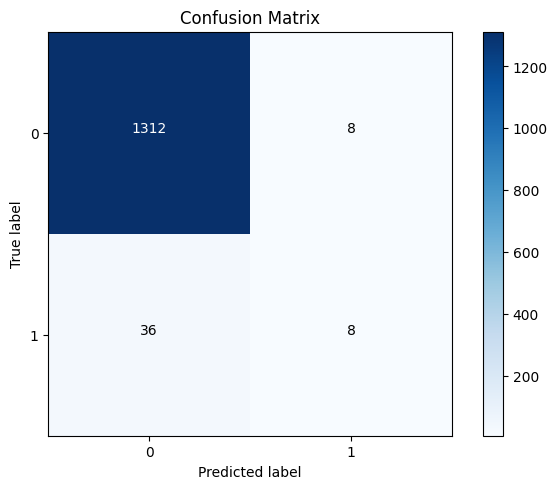

In [20]:
rfc =  RandomForestClassifier().fit(X_train, y_train)
y_pred = rfc.predict(X_test)
y_pred_proba = rfc.predict_proba(X_test)
y_pred_proba = y_pred_proba[:, 1]

print_evaluation_report(y_test, y_pred, y_pred_proba)

In [21]:
smoteSampler = SMOTE()
X_train_smote, y_train_smote = smoteSampler.fit_resample(X_train, y_train)

In [22]:
results = pd.DataFrame(
    columns=["Algorithm",  "CV-AUC", "CV-Accuracy", "CV-F1",
             "AUC", "Accuracy", "F1",])
results.set_index('Algorithm', inplace=True)

def cross_validate_models(classifiers, X, y, cv=5, results=None):
    for name in classifiers:
        classifier = classifiers[name]
        scoring_metrics = ['accuracy', 'f1', 'roc_auc', 'recall']
        cv_results = cross_validate(
            classifier, X, y, cv=cv, scoring=scoring_metrics)
        acc = cv_results['test_accuracy'].mean()
        f1 = cv_results['test_f1'].mean()
        auc = cv_results['test_roc_auc'].mean()
        recall = cv_results['test_recall'].mean()
        results.loc[name, 'CV-F1'] = f1
        results.loc[name, 'CV-AUC'] = auc
        results.loc[name, 'CV-Accuracy'] = acc
        results.loc[name, 'CV-Recall'] = recall

def test_models(classifiers, X_train, X_test, y_train, y_test, results):
    sb.set_palette('hls')
    confusion_matrix_fig, confusion_matrix_ax =\
        plt.subplots(1, len(classifiers), figsize=(
            15, 4), constrained_layout=True,)
    all_curves_fig, all_curves_ax = plt.subplots(figsize=(10, 10))
    for i, name in enumerate(classifiers):
        classifier = classifiers[name]
        classifier.fit(X_train, y_train)

        if hasattr(classifier, 'predict_proba'):
            y_pred_prob = classifier.predict_proba(X_test)[:, 1]
        elif hasattr(classifier, 'decision_function'):
            decision_function = classifier.decision_function(X_test)
            y_pred_prob = 1 / (1 + np.exp(-decision_function))
        fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
        roc_auc = auc(fpr, tpr)

        pred = classifier.predict(X_test)
        f1 = f1_score(y_test, pred)
        acc = accuracy_score(y_test, pred)
        recall = recall_score(y_test, pred)

        results.loc[name, "F1"] = f1
        results.loc[name, "AUC"] = roc_auc
        results.loc[name, "Accuracy"] = acc
        results.loc[name, "Recall"] = recall

        all_curves_ax.plot(fpr, tpr, lw=2,
                           label=f'{name} (AUC = {roc_auc:.2f})')

        cm = confusion_matrix(y_test, pred)
        ConfusionMatrixDisplay(cm).plot(
            ax=confusion_matrix_ax[i], colorbar=False, cmap=plt.cm.Blues)
        confusion_matrix_ax[i].grid(False)
        confusion_matrix_ax[i].set_title(name)

    all_curves_ax.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
    all_curves_ax.set_title('All ROC Curves')
    all_curves_ax.set_xlabel('False Positive Rate')
    all_curves_ax.set_ylabel('True Positive Rate')
    all_curves_ax.legend(loc='lower right')
    all_curves_fig.show()
    confusion_matrix_fig.show()
    results.sort_values(by='AUC', ascending=False)
    return results

<ipython-input-22-b771dcc748de>:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  all_curves_fig.show()
<ipython-input-22-b771dcc748de>:65: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  confusion_matrix_fig.show()


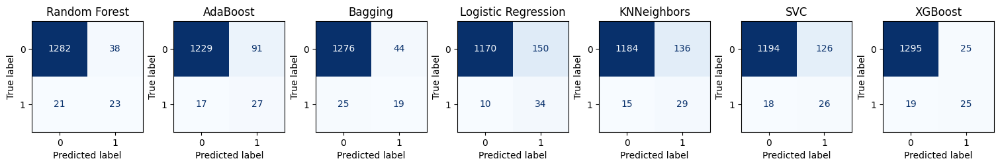

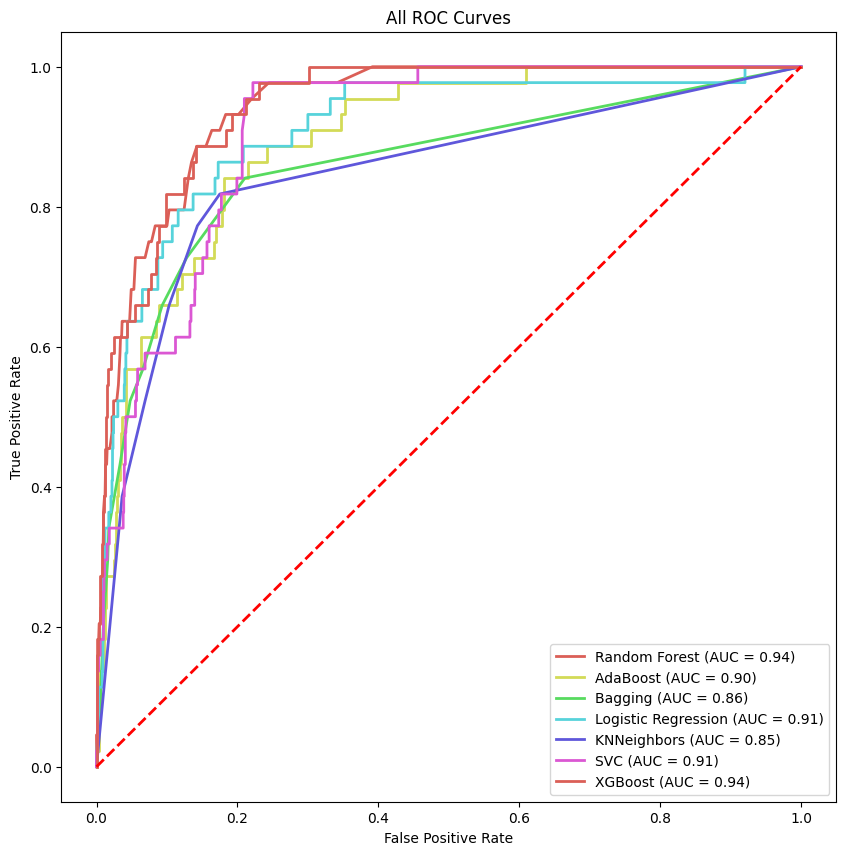

In [23]:
classifiers = {
    'Random Forest': RandomForestClassifier(),
    'AdaBoost': AdaBoostClassifier(),
    'Bagging': BaggingClassifier(),
    'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42),
    'KNNeighbors': KNeighborsClassifier(),
    'SVC': SVC(),
    'XGBoost': XGBClassifier()
}

classifiers_cv = {
    'Random Forest': make_pipeline(SMOTE(random_state=42), RandomForestClassifier()),
    'AdaBoost': make_pipeline(SMOTE(random_state=42), AdaBoostClassifier()),
    'Bagging': make_pipeline(SMOTE(random_state=42), BaggingClassifier()),
    'Logistic Regression': make_pipeline(SMOTE(random_state=42), LogisticRegression(max_iter=1000, random_state=42)),
    'KNNeighbors': make_pipeline(SMOTE(random_state=42), KNeighborsClassifier()),
    'SVC': make_pipeline(SMOTE(random_state=42), SVC()),
    'XGBoost': make_pipeline(SMOTE(random_state=42), XGBClassifier())
}

cross_validate_models(classifiers_cv, X_train,
                      y_train, results=results, cv=5)
results = test_models(classifiers, X_train_smote, X_test, y_train_smote, y_test, results)

In [24]:
results.sort_values(by='CV-F1', ascending=False)

,CV-AUC,CV-Accuracy,CV-F1,AUC,Accuracy,F1,CV-Recall,Recall
Algorithm,,,,,,,,
Random Forest,0.930055,0.95747,0.428875,0.943526,0.956745,0.438095,0.494603,0.522727
XGBoost,0.915317,0.95912,0.387492,0.94437,0.967742,0.531915,0.403968,0.568182
Bagging,0.852156,0.949038,0.362965,0.858084,0.949413,0.35514,0.454762,0.431818
AdaBoost,0.895156,0.92209,0.344717,0.896074,0.920821,0.333333,0.636508,0.613636
SVC,0.902022,0.896975,0.284364,0.908833,0.894428,0.265306,0.636349,0.590909
Logistic Regression,0.888462,0.87901,0.284003,0.909263,0.882698,0.298246,0.744444,0.772727
KNNeighbors,0.799709,0.880477,0.241447,0.846031,0.889296,0.277512,0.591587,0.659091


In [25]:
rf_param_grid = {
    'n_estimators': [200, 300, 500],
    'max_depth': [None, 30],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
}

rf_grid_search = GridSearchCV(RandomForestClassifier(), rf_param_grid, cv=5, scoring='roc_auc')
rf_grid_search.fit(X_train_smote, y_train_smote)
rf_grid_search.best_params_
#{'max_depth': None,
# 'min_samples_leaf': 1,
# 'min_samples_split': 2,
# 'n_estimators': 200}

{'max_depth': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 500}

In [26]:
xgb_param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [5, 7],
    'learning_rate': [0.2, 0.3],
    'subsample': [1.0, 1.1],
    'colsample_bytree': [0.9, 1.0]
}

xgb_grid_search = GridSearchCV(XGBClassifier(), xgb_param_grid, cv=5, scoring='roc_auc')

xgb_grid_search.fit(X_train_smote, y_train_smote)

print("XGBoost params:", xgb_grid_search.best_params_)
#XGBoost Best Parameters: {'colsample_bytree': 1.0, 'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 200, 'subsample': 1.0}

c:\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:425: FitFailedWarning: 
120 fits failed out of a total of 240.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
120 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Python311\Lib\site-packages\xgboost\core.py", line 730, in inner_f
    return func(**kwargs)
           ^^^^^^^^^^^^^^
  File "c:\Python311\Lib\site-packages\xgboost\sklearn.py", line 1519, in fit
    self._Booster = train(
                    ^^^^^^
  File "c:\Python311\Lib\site-packages\xgboost\core.py", line 730, in

XGBoost params: {'colsample_bytree': 0.9, 'learning_rate': 0.3, 'max_depth': 7, 'n_estimators': 300, 'subsample': 1.0}


<ipython-input-22-b771dcc748de>:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  all_curves_fig.show()
<ipython-input-22-b771dcc748de>:65: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  confusion_matrix_fig.show()


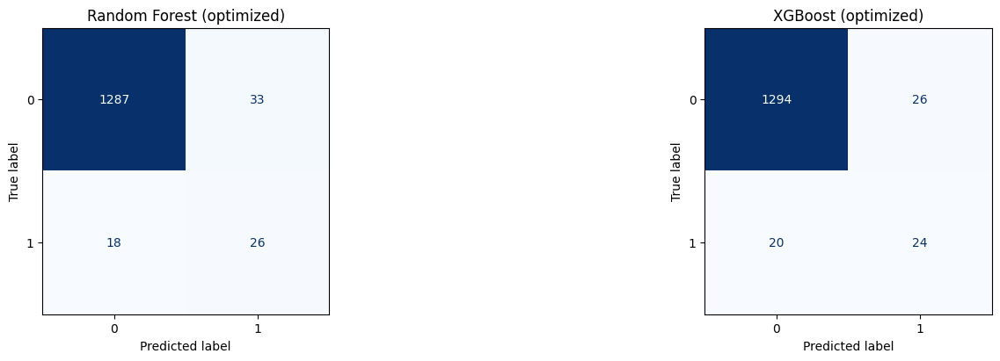

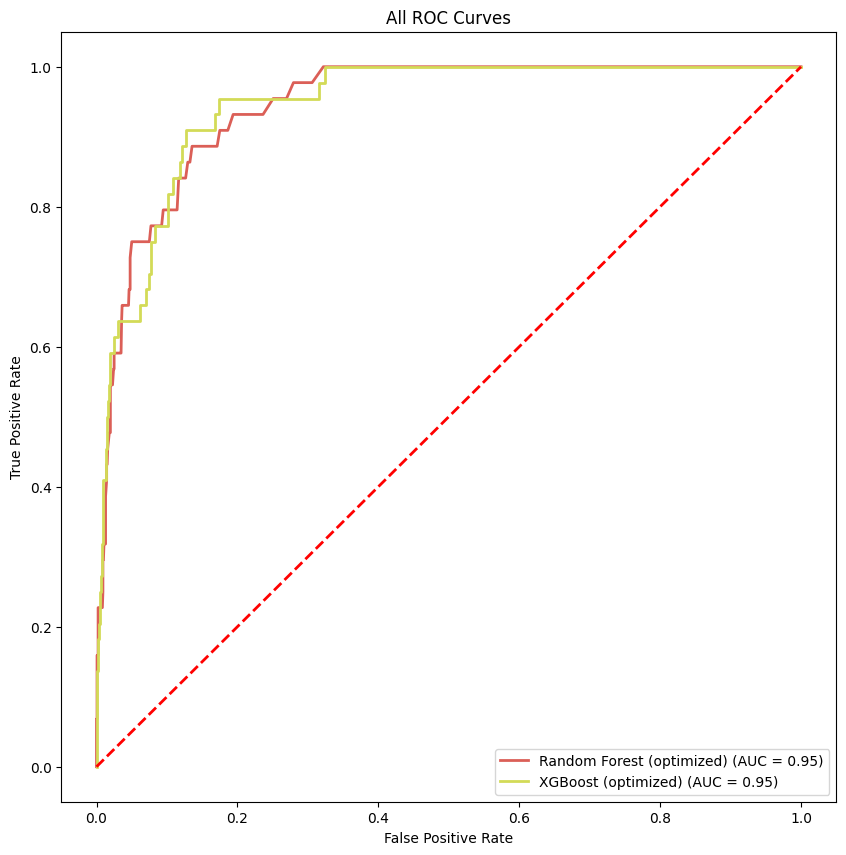

In [27]:
hp_optimized_models = {
    'Random Forest (optimized)': RandomForestClassifier(max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200),
    'XGBoost (optimized)': XGBClassifier(colsample_bytree = 1.0, learning_rate=0.2, max_depth=7, n_estimators=200, subsample=1.0),
}
hp_optimized_models_cv = {
    'Random Forest (optimized)': make_pipeline(SMOTE(random_state=42), RandomForestClassifier(max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200)),
    'XGBoost (optimized)': make_pipeline(SMOTE(random_state=42), XGBClassifier(colsample_bytree = 1.0, learning_rate=0.2, max_depth=7, n_estimators=200, subsample=1.0)),
}
cross_validate_models(hp_optimized_models_cv, X_train,
                      y_train, results=results)
results = test_models(hp_optimized_models, X_train_smote,
                      X_test, y_train_smote, y_test, results)

In [28]:
results.sort_values(by='CV-F1', ascending=False)

,CV-AUC,CV-Accuracy,CV-F1,AUC,Accuracy,F1,CV-Recall,Recall
Algorithm,,,,,,,,
Random Forest,0.930055,0.95747,0.428875,0.943526,0.956745,0.438095,0.494603,0.522727
Random Forest (optimized),0.929636,0.956004,0.411607,0.945257,0.96261,0.504854,0.483492,0.590909
XGBoost (optimized),0.923177,0.95857,0.392189,0.946074,0.966276,0.510638,0.420952,0.545455
XGBoost,0.915317,0.95912,0.387492,0.94437,0.967742,0.531915,0.403968,0.568182
Bagging,0.852156,0.949038,0.362965,0.858084,0.949413,0.35514,0.454762,0.431818
AdaBoost,0.895156,0.92209,0.344717,0.896074,0.920821,0.333333,0.636508,0.613636
SVC,0.902022,0.896975,0.284364,0.908833,0.894428,0.265306,0.636349,0.590909
Logistic Regression,0.888462,0.87901,0.284003,0.909263,0.882698,0.298246,0.744444,0.772727
KNNeighbors,0.799709,0.880477,0.241447,0.846031,0.889296,0.277512,0.591587,0.659091


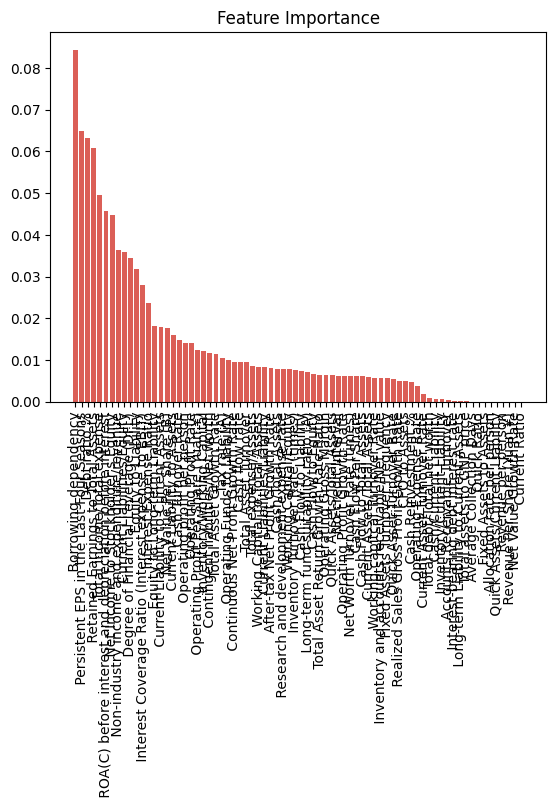

In [29]:
randomForest = RandomForestClassifier(random_state=0, criterion="entropy")
importances = hp_optimized_models['Random Forest (optimized)'].feature_importances_
indices = np.argsort(importances)[::-1]
names = [X.columns[i] for i in indices]

plt.figure()
plt.title("Feature Importance")
plt.bar(range(X.shape[1]), importances[indices])
plt.xticks(range(X.shape[1]), names, rotation=90)
plt.show()

<ipython-input-22-b771dcc748de>:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  all_curves_fig.show()
<ipython-input-22-b771dcc748de>:65: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  confusion_matrix_fig.show()


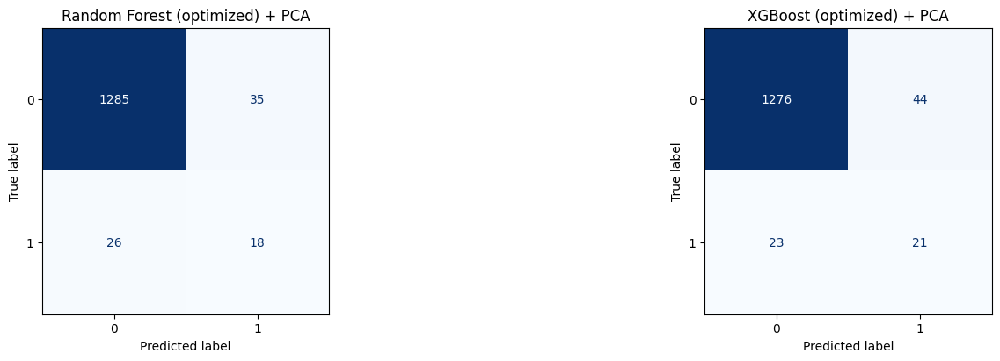

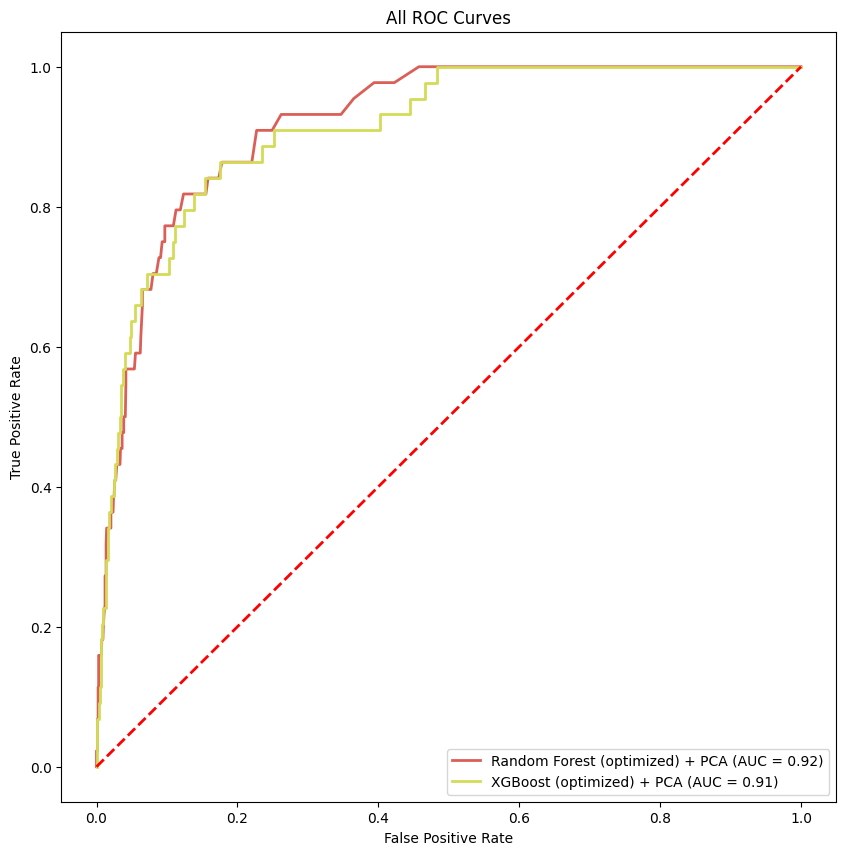

In [30]:
pca = PCA(n_components=0.95)
X_train_pca = pca.fit_transform(X_train_smote)
X_test_pca = pca.transform(X_test)
X_test_pca.shape

pca_optimized_models = {
    'Random Forest (optimized) + PCA': RandomForestClassifier(max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200),
    'XGBoost (optimized) + PCA': XGBClassifier(colsample_bytree = 1.0, learning_rate=0.2, max_depth=7, n_estimators=200, subsample=1.0),
}

results = test_models(pca_optimized_models, X_train_pca,
                      X_test_pca, y_train_smote, y_test, results)

In [31]:
results.sort_values(by='F1', ascending=False)

,CV-AUC,CV-Accuracy,CV-F1,AUC,Accuracy,F1,CV-Recall,Recall
Algorithm,,,,,,,,
XGBoost,0.915317,0.95912,0.387492,0.94437,0.967742,0.531915,0.403968,0.568182
XGBoost (optimized),0.923177,0.95857,0.392189,0.946074,0.966276,0.510638,0.420952,0.545455
Random Forest (optimized),0.929636,0.956004,0.411607,0.945257,0.96261,0.504854,0.483492,0.590909
Random Forest,0.930055,0.95747,0.428875,0.943526,0.956745,0.438095,0.494603,0.522727
XGBoost (optimized) + PCA,NaN,NaN,NaN,0.910606,0.95088,0.385321,NaN,0.477273
Random Forest (optimized) + PCA,NaN,NaN,NaN,0.919413,0.955279,0.371134,NaN,0.409091
Bagging,0.852156,0.949038,0.362965,0.858084,0.949413,0.35514,0.454762,0.431818
AdaBoost,0.895156,0.92209,0.344717,0.896074,0.920821,0.333333,0.636508,0.613636
Logistic Regression,0.888462,0.87901,0.284003,0.909263,0.882698,0.298246,0.744444,0.772727


<ipython-input-22-b771dcc748de>:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  all_curves_fig.show()
<ipython-input-22-b771dcc748de>:65: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  confusion_matrix_fig.show()


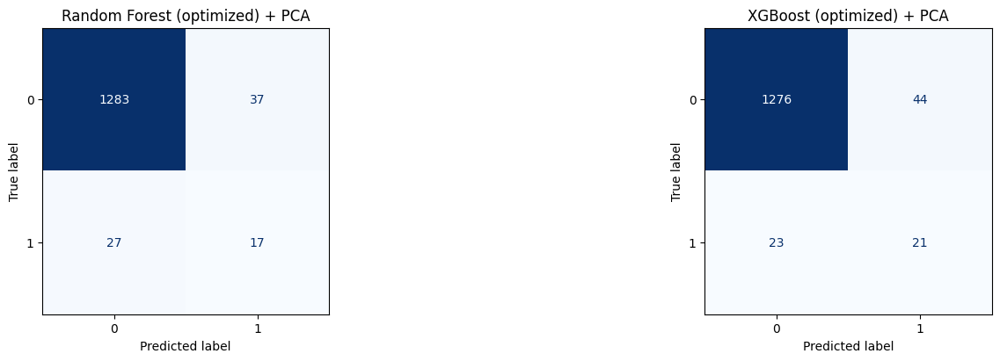

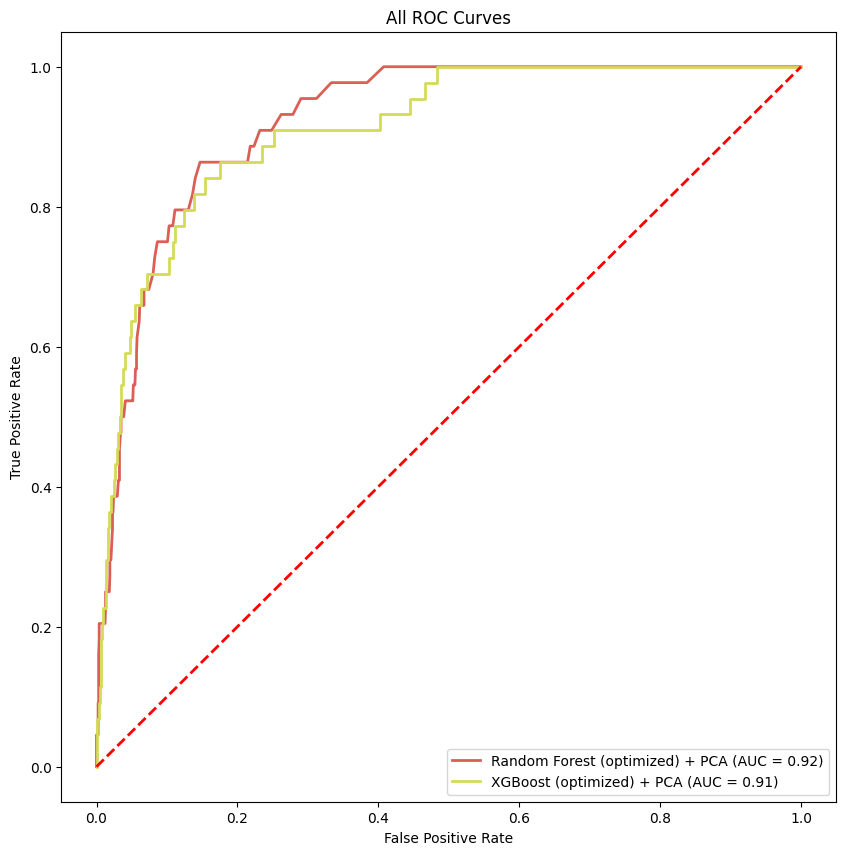

In [32]:
pca_optimized_models = {
    'Random Forest (optimized) + PCA': RandomForestClassifier(max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200),
    'XGBoost (optimized) + PCA': XGBClassifier(colsample_bytree = 1.0, learning_rate=0.2, max_depth=7, n_estimators=200, subsample=1.0),
}

results = test_models(pca_optimized_models, X_train_pca,
                      X_test_pca, y_train_smote, y_test, results)

c:\Python311\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.148e+02, tolerance: 2.640e-01
  model = cd_fast.enet_coordinate_descent(


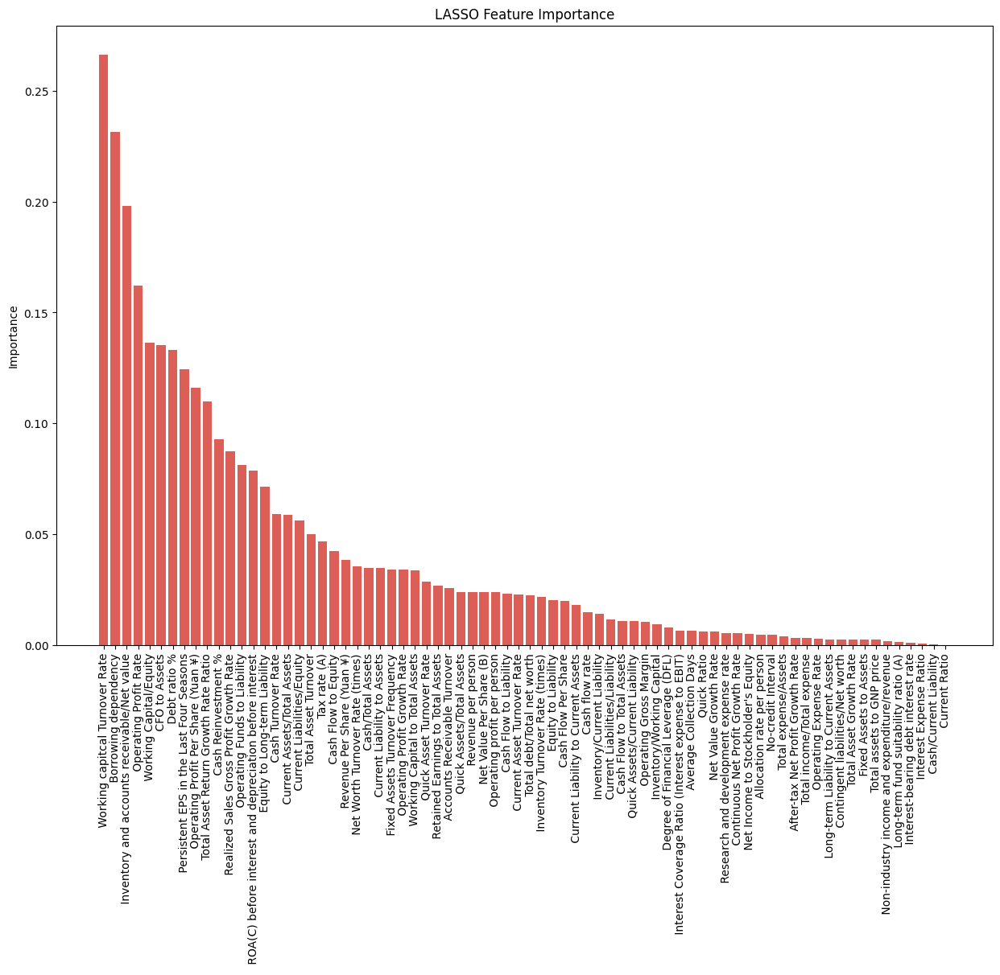

In [33]:
lasso = Lasso(alpha=0.00001)
lasso.fit(X_train_smote, y_train_smote)
lasso_coef = np.abs(lasso.coef_)
pd_lasso = pd.DataFrame(lasso_coef, index=X.columns, columns=['coef'])

pd_lasso.sort_values(by='coef', ascending=False, inplace=True)
plt.figure(figsize=(15, 10))
plt.xticks(rotation=90)
plt.bar(pd_lasso.index, pd_lasso['coef'])
plt.ylabel("Importance")
plt.title("LASSO Feature Importance")
plt.show()

<ipython-input-22-b771dcc748de>:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  all_curves_fig.show()
<ipython-input-22-b771dcc748de>:65: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  confusion_matrix_fig.show()


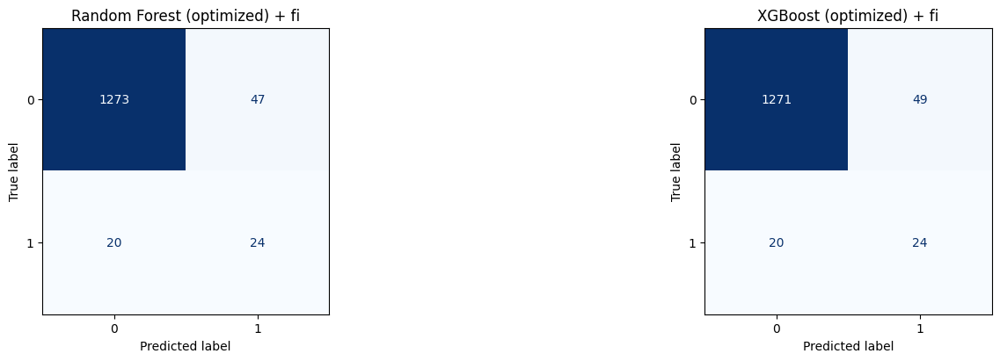

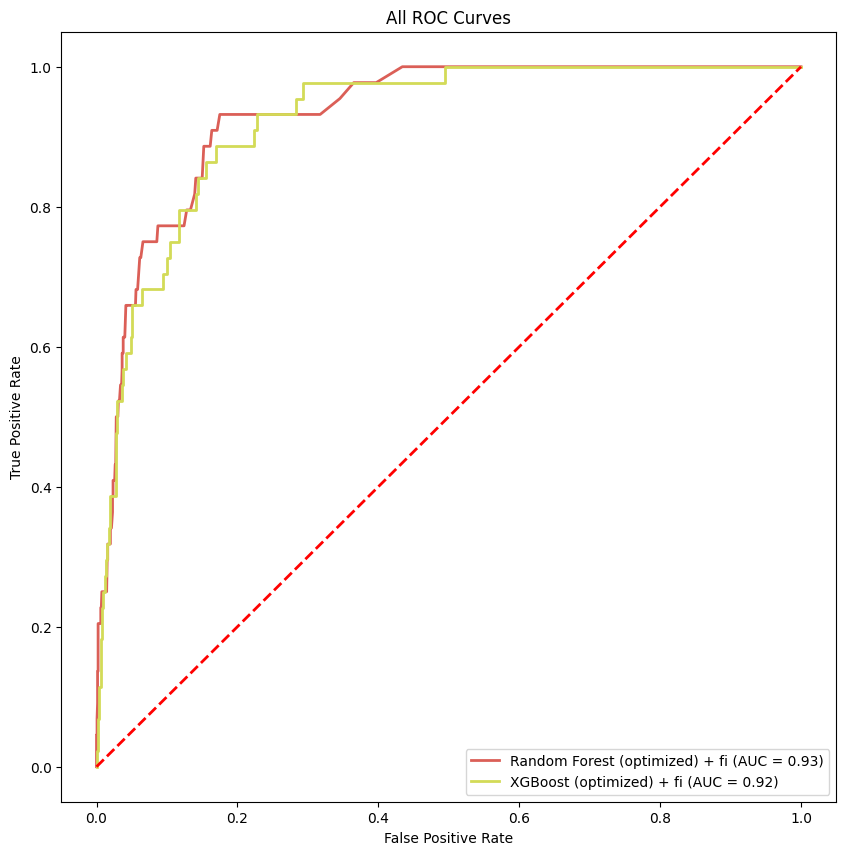

In [35]:
fi_optimized_models = {
    'Random Forest (optimized) + fi': RandomForestClassifier(max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200),
    'XGBoost (optimized) + fi': XGBClassifier(colsample_bytree = 1.0, learning_rate=0.2, max_depth=7, n_estimators=200, subsample=1.0),
}
selected_features = lasso_coef >= 0.025

X_train_lasso = pd.DataFrame(X_train_smote, columns=X.columns)
X_train_lasso = X_train_lasso.loc[:, selected_features]

X_test_lasso = pd.DataFrame(X_test, columns=X.columns)
X_test_lasso = X_test_lasso.loc[:, selected_features]


results = test_models(fi_optimized_models, X_train_lasso, X_test_lasso, y_train_smote, y_test, results)

In [36]:
results.sort_values(by='F1', ascending=False)

,CV-AUC,CV-Accuracy,CV-F1,AUC,Accuracy,F1,CV-Recall,Recall
Algorithm,,,,,,,,
XGBoost,0.915317,0.95912,0.387492,0.94437,0.967742,0.531915,0.403968,0.568182
XGBoost (optimized),0.923177,0.95857,0.392189,0.946074,0.966276,0.510638,0.420952,0.545455
Random Forest (optimized),0.929636,0.956004,0.411607,0.945257,0.96261,0.504854,0.483492,0.590909
Random Forest,0.930055,0.95747,0.428875,0.943526,0.956745,0.438095,0.494603,0.522727
Random Forest (optimized) + fi,NaN,NaN,NaN,0.93199,0.95088,0.417391,NaN,0.545455
XGBoost (optimized) + fi,NaN,NaN,NaN,0.924656,0.949413,0.410256,NaN,0.545455
XGBoost (optimized) + PCA,NaN,NaN,NaN,0.910606,0.95088,0.385321,NaN,0.477273
Bagging,0.852156,0.949038,0.362965,0.858084,0.949413,0.35514,0.454762,0.431818
Random Forest (optimized) + PCA,NaN,NaN,NaN,0.923691,0.953079,0.346939,NaN,0.386364
